<a href="https://colab.research.google.com/github/banned-books/project_banned_books/blob/main/eda/books_metadata_eda.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Mount GDrive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Import Libraries

In [ ]:
import pandas as pd
from scattertext.termranking import AbsoluteFrequencyRanker
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from scipy import linalg
import gensim
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import scattertext as st
import seaborn as sns
from wordcloud import WordCloud
import altair as alt

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

## Import Cleaned Data on Banned Books for EDA


In [ ]:
df = pd.read_pickle('/content/drive/MyDrive/Colab Notebooks/data/cleaned_trained_data/clean_topic_modeling.pkl')

In [ ]:
df.head(1)

,goodreads_image_url,title,author,goodreads_published_date,goodreads_description,goodreads_tags,type_of_ban,state,district,ban_date,origin_of_challenge,goodreads_product_url,amazon_url,secondary_authors,illustrators,translators,text,Tokens,Joined_Tokens,top_10_words,parse
0,https://images-na.ssl-images-amazon.com/images...,The Haters,"Andrews, Jesse",2016-04-07,From Jesse Andrews author of the New York Tim...,"young adult, contemporary, music, fiction, rea...",Banned Pending Investigation,Michigan,Rochester Community Schools District,April 2022,Administrator,https://www.goodreads.com/book/show/26095121-t...,https://www.amazon.com/Haters-Jesse-Andrews/pr...,NaN,NaN,NaN,"the haters young adult, contemporary, music, f...","[haters, young, adult, contemporary, music, fi...",haters young adult contemporary music fiction ...,"[haters, road, trip, music, humor, contemporar...","(haters, young, adult, contemporary, music, fi..."


## Import Original Banned Book Dataset for EDA

In [ ]:
banned_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/data/original_data/banned_books.csv')
banned_df.head(1)

,goodreads_image_url,title,author,goodreads_published_date,goodreads_description,goodreads_tags,type_of_ban,state,district,ban_date,origin_of_challenge,goodreads_product_url,amazon_url,secondary_authors,illustrators,translators
0,https://images-na.ssl-images-amazon.com/images...,Ace of Spades,"Àbíké-Íyímídé, Faridah",2021-06-01,An incendiary and utterly compelling thriller ...,"dark, lgbtqia+, black, young adult, gay romanc...",Banned in Libraries and Classrooms,Florida,Indian River County School District,November 2021,Administrator,https://www.goodreads.com/book/show/42603984-a...,https://www.amazon.com/Ace-Spades-Faridah-Abik...,NaN,NaN,NaN


## Scattertext EDA

In [ ]:
corpus = (
    st.CorpusWithoutCategoriesFromParsedDocuments(df, parsed_col="parse")
    .build()
    .get_unigram_corpus()
)
corpus.remove_infrequent_words(
    minimum_term_count=6, term_ranker=AbsoluteFrequencyRanker
)
corpus.get_categories()

['_']

In [ ]:
dispersion = st.Dispersion(corpus)
dispersion_df = dispersion.get_df()
dispersion_df.head(5)

,Frequency,Range,SD,VC,Juilland's D,Rosengren's S,DP,DP norm,KL-divergence
haters,3,3,0.034401,29.034462,0.422878,0.001147,0.998853,0.998904,9.768000
young,1855,1374,0.783415,1.069329,0.979301,0.553190,0.433573,0.433595,0.900249
adult,2142,1486,0.873502,1.032543,0.979970,0.591388,0.393131,0.393151,0.822496
contemporary,1461,1134,0.713219,1.236052,0.975797,0.459428,0.529087,0.529114,1.162550
music,67,63,0.170061,6.426773,0.871166,0.025109,0.974513,0.974562,5.339098


In [ ]:
dispersion_df = dispersion_df.assign(
    X=lambda df: df.Frequency,
    Xpos=lambda df: st.Scalers.log_scale(df.X),
    Y=lambda df: df["Rosengren's S"],
    Ypos=lambda df: st.Scalers.scale(df.Y),
)

In [ ]:
html = st.dataframe_scattertext(
    corpus,
    plot_df=dispersion_df,
    ignore_categories=True,
    color_score_column="ColorScore",
    x_label="Log Frequency",
    y_label="Rosengren's S",
    y_axis_labels=["Less Dispersion", "Medium", "More Dispersion"],
)

open("unga_dispersion.html", "wb").write(html.encode("utf-8"))

/usr/local/lib/python3.9/dist-packages/scattertext/Scalers.py:247: RuntimeWarning: invalid value encountered in true_divide
  vec_ss = (vec_ss - vec_ss.min()) * 1. / (vec_ss.max() - vec_ss.min())


2307744

In [ ]:
topic_corpus = (
    st.CorpusFromParsedDocuments(
        df,
        category_col="origin_of_challenge",
        parsed_col="parse",
    )
    .build()
    .get_unigram_corpus()
    .compact(st.AssociationCompactor(2000))
)


In [ ]:
html = st.produce_scattertext_explorer(
    topic_corpus,
    category="Administrator",
    category_name="Political or Parental Pressure",
    not_category_name="Formal Written Challenge",
    minimum_term_frequency=0,
    pmi_threshold_coefficient=0,
    width_in_pixels=1000,
    metadata=corpus.get_df()["state"],
    transform=st.Scalers.dense_rank,
)

open("./un_dispersion_category.html", "w").write(html)

1021666

## Wordcloud EDA

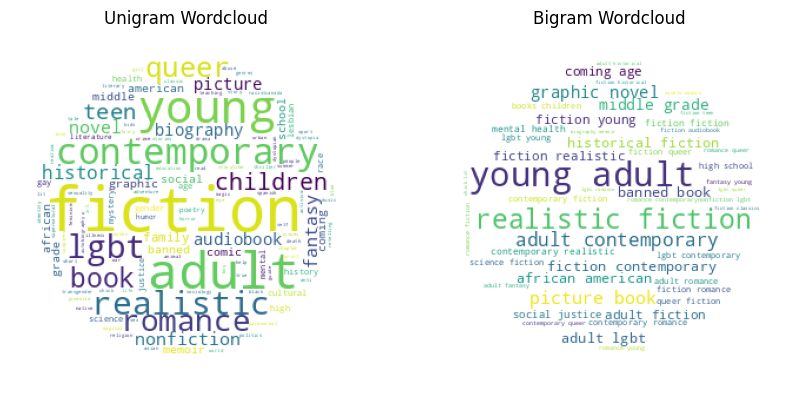

In [ ]:
text = "square"
x, y = np.ogrid[:300, :300]
mask = (x - 150) ** 2 + (y - 150) ** 2 > 130**2
mask = 255 * mask.astype(int)

#joins all the tokens in the "Joined_Tokens" column into a single string.
all_tokens = "".join(df["Joined_Tokens"])

# generate unigram wordcloud
unigram_wordcloud = WordCloud(
    collocations=False, background_color="white", mask=mask
).generate(all_tokens)

# Generate a bi-gram word cloud
bigram_wordcloud = WordCloud(
    collocation_threshold=2, collocations=True, background_color="white", mask=mask
).generate(all_tokens)

# plot the wordclouds side by side
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

axes[0].imshow(unigram_wordcloud)
axes[0].set_title("Unigram Wordcloud")
axes[0].axis("off")

axes[1].imshow(bigram_wordcloud)
axes[1].set_title("Bigram Wordcloud")
axes[1].axis("off")

plt.show()

## NGram Graphs EDA

In [ ]:
def get_top_ngrams(corpus, ngram_range, stop_words=None, n=None):
    vec = CountVectorizer(stop_words=stop_words, ngram_range=ngram_range).fit(corpus)
    bag_of_words = vec.transform(corpus)

    sum_words = bag_of_words.sum(axis=0)

    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)

    common_words = words_freq[:n]
    words = []
    freqs = []
    for word, freq in common_words:
        words.append(word)
        freqs.append(freq)

    word_df = pd.DataFrame({"Word": words, "Freq": freqs})
    return word_df


stop_words = "english"
n = 20
unigrams_st = get_top_ngrams(df["Joined_Tokens"], (1, 1), stop_words, n)
bigrams_st = get_top_ngrams(df["Joined_Tokens"], (2, 2), stop_words, n)
trigrams_st = get_top_ngrams(df["Joined_Tokens"], (3, 3), stop_words, n)


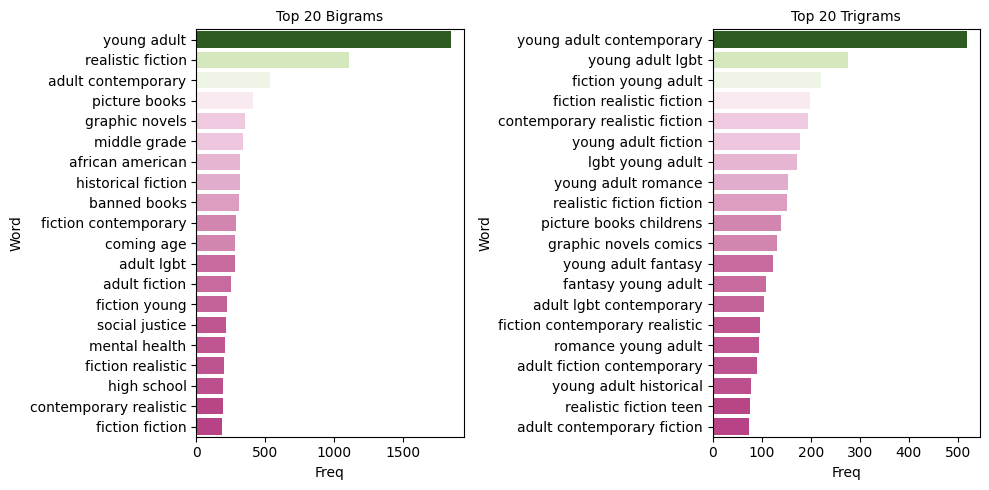

In [ ]:
# Now Plot
# Create a function to map bar length to color
cmap = matplotlib.colormaps["PiYG"]


def map_color(x):
    return cmap(x / max(unigrams_st["Freq"]))


# Plot bigram and trigram distribution side by side
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
axes[0].set_title("Top 20 Bigrams", size=10)
sns.barplot(
    x="Freq",
    y="Word",
    data=bigrams_st,
    ax=axes[0],
    palette=sns.color_palette([map_color(x) for x in unigrams_st["Freq"]]),
)
axes[1].set_title("Top 20 Trigrams", size=10)
sns.barplot(
    x="Freq",
    y="Word",
    data=trigrams_st,
    ax=axes[1],
    palette=sns.color_palette([map_color(x) for x in unigrams_st["Freq"]]),
)
fig.tight_layout()
plt.show()

## More EDA

In [ ]:
df.head(2)

,goodreads_image_url,title,author,goodreads_published_date,goodreads_description,goodreads_tags,type_of_ban,state,district,ban_date,origin_of_challenge,goodreads_product_url,amazon_url,secondary_authors,illustrators,translators,text,Tokens,Joined_Tokens,top_10_words,parse
0,https://images-na.ssl-images-amazon.com/images...,The Haters,"Andrews, Jesse",2016-04-07,From Jesse Andrews author of the New York Tim...,"young adult, contemporary, music, fiction, rea...",Banned Pending Investigation,Michigan,Rochester Community Schools District,April 2022,Administrator,https://www.goodreads.com/book/show/26095121-t...,https://www.amazon.com/Haters-Jesse-Andrews/pr...,NaN,NaN,NaN,"the haters young adult, contemporary, music, f...","[haters, young, adult, contemporary, music, fi...",haters young adult contemporary music fiction ...,"[haters, road, trip, music, humor, contemporar...","(haters, young, adult, contemporary, music, fi..."
1,https://images-na.ssl-images-amazon.com/images...,Gender Queer: A Memoir,"Kobabe, Maia",2019-05-28,In 2014 Maia Kobabe who uses e em eir pronou...,"graphic novels, lgbt, memoir, nonfiction, quee...",Banned Pending Investigation,New York,Connetquot Central School District,April 2022,Formal Challenge,https://www.goodreads.com/book/show/42837514-g...,https://www.amazon.com/Gender-Queer-Memoir-Mai...,NaN,NaN,NaN,"gender queer: a memoir graphic novels, lgbt, m...","[gender, queer, memoir, graphic, novels, lgbt,...",gender queer memoir graphic novels lgbt memoir...,"[gender, comics, graphic, memoir, novels, quee...","(gender, queer, memoir, graphic, novels, lgbt,..."


In [ ]:
alt.Chart(banned_df).mark_point().encode(
    x='count(type_of_ban):Q',
    y='type_of_ban:N',
    color='origin_of_challenge'
)

alt.Chart(...)

In [ ]:
alt.Chart(banned_df).mark_point().encode(
    x='count(type_of_ban):Q',
    y='state:N',
    color='origin_of_challenge'
)

alt.Chart(...)

In [ ]:
alt.Chart(banned_df).mark_bar().encode(
    x='ban_date:T',
    y='count(type_of_ban):Q',
    color='type_of_ban'
)

alt.Chart(...)

In [ ]:
alt.Chart(banned_df).mark_bar().encode(
    x='count(type_of_ban):Q',
    y='state',
    color='origin_of_challenge'
)

alt.Chart(...)